1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━

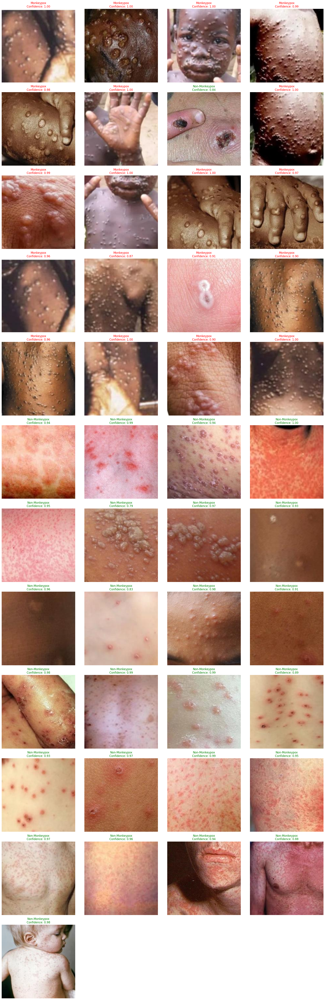

Testing completed.


In [8]:
import tensorflow as tf
import numpy as np
import os
from PIL import Image
import matplotlib.pyplot as plt

# Load the saved model
model_path = '/content/drive/MyDrive/monkeypox_model.keras'
model = tf.keras.models.load_model(model_path)

# Define the directory containing test images
test_dir = "/content/drive/MyDrive/monkeypoxtest/"

# Define image preprocessing function
def preprocess_image(image_path):
    img = Image.open(image_path)
    img = img.resize((224, 224))  # Resize to match model input size
    img_array = np.array(img) / 255.0  # Normalize pixel values
    return np.expand_dims(img_array, axis=0)  # Add batch dimension

# Get list of image files
image_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Process each image and make predictions
plt.figure(figsize=(20, 5 * ((len(image_files) + 3) // 4)))  # Adjust figure size based on number of images

for i, image_file in enumerate(image_files, 1):
    image_path = os.path.join(test_dir, image_file)

    # Preprocess the image
    img = preprocess_image(image_path)

    # Make prediction
    prediction = model.predict(img)

    # Interpret the prediction
    # Assuming 0 is 'monkeypox' and 1 is 'non-monkeypox'
    label = "Monkeypox" if prediction[0][0] < 0.5 else "Non-Monkeypox"
    confidence = prediction[0][0] if label == "Non-Monkeypox" else 1 - prediction[0][0]

    # Display image and prediction
    plt.subplot(((len(image_files) + 3) // 4), 4, i)
    img_display = Image.open(image_path)
    plt.imshow(img_display)
    plt.axis('off')
    plt.title(f"{label}\nConfidence: {confidence:.2f}", color='green' if label == "Non-Monkeypox" else 'red')

plt.tight_layout()
plt.show()

print("Testing completed.")